# RhoMol workflow (training + IL6ST-EGCG)

本 notebook 包含两部分：
1) 全量训练：Pocket→Ligand density diffusion；fragment extension（GPPM + TAPM）。
2) 推理与分子生成：以 `IL6ST-EGCG.pdb` 为输入，预测 ligand ED，生成候选分子，并进行 GNINA 亲和力计算与 Top 20 展示。

训练与推理的产物会写入 `outputs/rhomol_run_<timestamp>/`。


In [1]:
import os
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import torch

ROOT = Path.cwd().resolve()
if not (ROOT / "rhomol").exists() and (ROOT.parent / "rhomol").exists():
    ROOT = ROOT.parent
sys.path.insert(0, str(ROOT))


def set_plot_style() -> None:
    try:
        import scienceplots  # noqa: F401

        plt.style.use(["science", "no-latex", "grid"])
    except Exception:
        plt.style.use("seaborn-v0_8-whitegrid")

    plt.rcParams.update(
        {
            "figure.dpi": 140,
            "savefig.dpi": 300,
            "axes.titlesize": 12,
            "axes.labelsize": 11,
            "legend.fontsize": 9,
            "font.size": 11,
        }
    )


set_plot_style()

print("root:", ROOT)
print("python:", sys.executable)
print("torch:", torch.__version__)
print("cuda available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("cuda devices:", torch.cuda.device_count())


root: /media/xuchengjie/E7562A2674DB25F7/Tongji
python: /home/xuchengjie/miniconda3/envs/rhomol/bin/python
torch: 2.4.1
cuda available: True
cuda devices: 2


In [2]:
# Environment sanity check
import py3Dmol
from rdkit import Chem, rdBase

print("py3Dmol:", getattr(py3Dmol, "__version__", "(unknown)"))
print("rdkit:", getattr(rdBase, "rdkitVersion", "(unknown)"))

try:
    import torch_geometric

    print("pyg:", getattr(torch_geometric, "__version__", "(unknown)"))
except Exception as e:
    print("pyg: (missing)")
    print("pyg import error:", repr(e))


py3Dmol: 2.5.3
rdkit: 2023.03.3
pyg: 2.6.1


In [3]:
from datetime import datetime

ED_TGZ = ROOT / "ED_extraction_dataset.tgz"
FRAG_TGZ = ROOT / "fragment_extension_dataset.tgz"

DATA_CANDIDATES = [
    ROOT / "rhomol" / "data",
    ROOT / "data",
]
DATA = next(
    (
        p
        for p in DATA_CANDIDATES
        if (p / "ED_extraction_dataset").exists() or (p / "fragment_extension_dataset").exists()
    ),
    DATA_CANDIDATES[0],
)

OUT = ROOT / "outputs"
OUT.mkdir(parents=True, exist_ok=True)

RUN_ID = os.environ.get("RHOMOL_RUN_ID") or datetime.now().strftime("%Y%m%d_%H%M%S")
RUN = OUT / f"rhomol_run_{RUN_ID}"
FIG_DIR = RUN / "figures"
WEIGHTS_DIR = RUN / "weights"
LOG_DIR = RUN / "logs"
for p in [RUN, FIG_DIR, WEIGHTS_DIR, LOG_DIR]:
    p.mkdir(parents=True, exist_ok=True)

print("ED tgz:", ED_TGZ.exists(), ED_TGZ)
print("Frag tgz:", FRAG_TGZ.exists(), FRAG_TGZ)
print("Data dir:", DATA)
print("  - ED extraction:", (DATA / "ED_extraction_dataset").exists())
print("  - Fragment extension:", (DATA / "fragment_extension_dataset").exists())
print("Outputs dir:", OUT)
print("Run dir:", RUN)


ED tgz: True /media/xuchengjie/E7562A2674DB25F7/Tongji/ED_extraction_dataset.tgz
Frag tgz: True /media/xuchengjie/E7562A2674DB25F7/Tongji/fragment_extension_dataset.tgz
Data dir: /media/xuchengjie/E7562A2674DB25F7/Tongji/rhomol/data
  - ED extraction: True
  - Fragment extension: True
Outputs dir: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs
Run dir: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041


## 0) 数据解压（训练需要）

Notebook 会在检测到 `rhomol/data/ED_extraction_dataset` 或 `rhomol/data/fragment_extension_dataset` 缺失时，自动将 `ED_extraction_dataset.tgz` 与 `fragment_extension_dataset.tgz` 解压到数据目录。

该步骤会耗时，并会占用大量磁盘空间。


In [4]:
import subprocess


def ensure_extracted(tgz_path: Path, out_dir: Path, expected_dir: str) -> Path:
    out_dir.mkdir(parents=True, exist_ok=True)
    target = out_dir / expected_dir
    if target.exists():
        return target
    if not tgz_path.exists():
        raise FileNotFoundError(f"Missing archive: {tgz_path}")
    print(f"extracting: {tgz_path.name} -> {out_dir}/")
    subprocess.run(["tar", "-xzf", str(tgz_path), "-C", str(out_dir)], check=True)
    if not target.exists():
        raise FileNotFoundError(f"Extraction finished but directory not found: {target}")
    return target


ED_ROOT = ensure_extracted(ED_TGZ, DATA, "ED_extraction_dataset")
FRAG_ROOT = ensure_extracted(FRAG_TGZ, DATA, "fragment_extension_dataset")

print("ED_ROOT:", ED_ROOT)
print("FRAG_ROOT:", FRAG_ROOT)


ED_ROOT: /media/xuchengjie/E7562A2674DB25F7/Tongji/rhomol/data/ED_extraction_dataset
FRAG_ROOT: /media/xuchengjie/E7562A2674DB25F7/Tongji/rhomol/data/fragment_extension_dataset


## 1) Pocket→Ligand Density：条件 3D Diffusion（RhoMol）

下面为全量训练：训练/验证日志与 checkpoint 会写入本次运行目录。
如需快速跑通，可通过环境变量覆盖步数（不影响默认全量设置）。


In [5]:
import pandas as pd
from torch.utils.data import DataLoader

from rhomol.data.ed_extraction_dataset import EDExtractionDataset
from rhomol.models.density_diffusion import Pocket2LigEDDiffusion, make_cosine_schedule
from rhomol.train.train_density import load_diffusion_ema_checkpoint, train_pocket2lig_diffusion_steps

ed_root = Path(ED_ROOT)
print("ED extraction dataset:", ed_root)

train_ds = EDExtractionDataset(ed_root, split="train", normalize="max")
val_ds = EDExtractionDataset(ed_root, split="val", normalize="max")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

train_loader = DataLoader(train_ds, batch_size=1, shuffle=True, num_workers=4, pin_memory=(device.type == "cuda"))
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False, num_workers=4, pin_memory=(device.type == "cuda"))

DIFFUSION_STEPS = int(os.environ.get("RHOMOL_DIFFUSION_STEPS", "50000"))
VAL_EVERY = int(os.environ.get("RHOMOL_DIFFUSION_VAL_EVERY", "5000"))
SAVE_EVERY = int(os.environ.get("RHOMOL_DIFFUSION_SAVE_EVERY", "5000"))
LOG_EVERY = int(os.environ.get("RHOMOL_DIFFUSION_LOG_EVERY", "50"))
LOG_EVERY = min(LOG_EVERY, max(1, DIFFUSION_STEPS))

model = Pocket2LigEDDiffusion(T=200, base_channels=64, time_dim=256, cond_drop_prob=0.1).to(device)
schedule = make_cosine_schedule(model.T, device=device)

resume_ckpt = WEIGHTS_DIR / "Pocket2LigEDDiffusion_last.ckpt"
resume_ckpt = resume_ckpt if resume_ckpt.exists() else None
if resume_ckpt is not None:
    try:
        obj = torch.load(resume_ckpt, map_location="cpu")
        state = obj["model_state_dict"] if isinstance(obj, dict) and "model_state_dict" in obj else obj
        if set(state.keys()) != set(model.state_dict().keys()):
            print("resume checkpoint incompatible with current diffusion arch; ignoring:", resume_ckpt)
            resume_ckpt = None
    except Exception as e:
        print("failed to read resume checkpoint; ignoring:", repr(e))
        resume_ckpt = None
if resume_ckpt is not None:
    print("resuming from:", resume_ckpt)

best_ckpt, diff_history = train_pocket2lig_diffusion_steps(
    model,
    schedule=schedule,
    train_loader=train_loader,
    val_loader=val_loader,
    out_dir=WEIGHTS_DIR,
    device=device,
    lr=1e-4,
    max_steps=DIFFUSION_STEPS,
    grad_clip=0.5,
    log_every=LOG_EVERY,
    val_every=VAL_EVERY,
    num_val_batches=50,
    save_every=SAVE_EVERY,
    grad_accum=4,
    amp=None,
    resume_ckpt=resume_ckpt,
)

diff_df = pd.DataFrame(diff_history).sort_values("step")
diff_csv = LOG_DIR / "diffusion_history.csv"
diff_df.to_csv(diff_csv, index=False)
print("saved:", best_ckpt)
print("saved:", diff_csv)

best_ckpt = Path(best_ckpt)
last_ckpt = WEIGHTS_DIR / "Pocket2LigEDDiffusion_last.ckpt"
if best_ckpt.exists():
    ckpt_to_load = best_ckpt
elif last_ckpt.exists():
    ckpt_to_load = last_ckpt
else:
    raise FileNotFoundError(f"No diffusion checkpoint found under {WEIGHTS_DIR}")
print("loading:", ckpt_to_load)
diffusion_ema = load_diffusion_ema_checkpoint(ckpt_to_load, device=device)


ED extraction dataset: /media/xuchengjie/E7562A2674DB25F7/Tongji/rhomol/data/ED_extraction_dataset
device: cuda


/media/xuchengjie/E7562A2674DB25F7/Tongji/rhomol/train/train_density.py:387: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=amp_enabled)
Train Diffusion:   0%|          | 0/50000 [00:00<?, ?it/s]/media/xuchengjie/E7562A2674DB25F7/Tongji/rhomol/train/train_density.py:440: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(**autocast_kwargs):
Train Diffusion: 100%|██████████| 50000/50000 [1:06:21<00:00, 12.56it/s, loss=0.000946, val=0.000474]
/media/xuchengjie/E7562A2674DB25F7/Tongji/rhomol/train/train_density.py:313: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://gith

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/weights/Pocket2LigEDDiffusion.ckpt
saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/logs/diffusion_history.csv
loading: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/weights/Pocket2LigEDDiffusion.ckpt


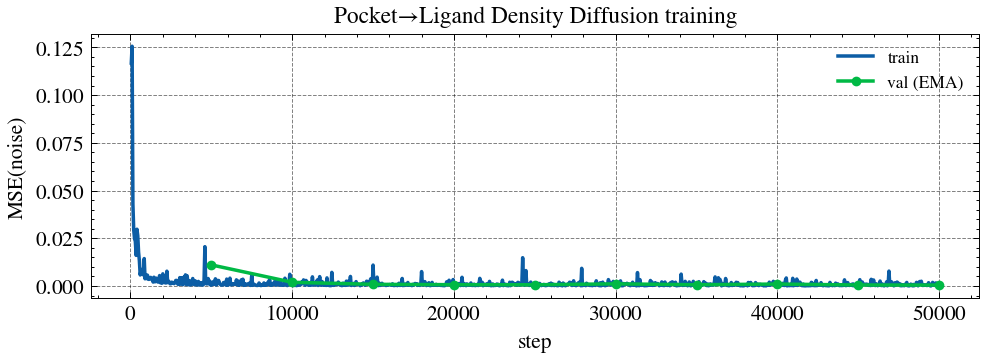

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/figures/diffusion_loss.png


In [6]:
import matplotlib.pyplot as plt

if ("diff_df" not in globals()) or diff_df is None or diff_df.empty or ("train_loss" not in diff_df.columns):
    print("diffusion history is empty; skip loss plot")
else:
    train_df = diff_df.dropna(subset=["train_loss"])
    val_df = diff_df.dropna(subset=["val_loss"]) if "val_loss" in diff_df.columns else diff_df.iloc[0:0]

    plt.figure(figsize=(7.2, 2.8))
    plt.plot(train_df["step"], train_df["train_loss"], lw=1.8, label="train")
    if ("val_loss" in diff_df.columns) and (not val_df.empty):
        plt.plot(val_df["step"], val_df["val_loss"], lw=1.8, marker="o", ms=4, label="val (EMA)")
    plt.xlabel("step")
    plt.ylabel("MSE(noise)")
    plt.title("Pocket→Ligand Density Diffusion training")
    plt.legend(frameon=False)
    plt.tight_layout()
    plt.savefig(FIG_DIR / "diffusion_loss.png", bbox_inches="tight")
    plt.show()
    print("saved:", FIG_DIR / "diffusion_loss.png")


## 2) Fragment extension 模型训练（GPPM + TAPM）

下面为全量训练：训练/验证日志与 checkpoint 会写入本次运行目录。
如需快速跑通，可通过环境变量覆盖步数（不影响默认全量设置）。


In [7]:
frag_root = Path(FRAG_ROOT)
if not frag_root.exists():
    raise FileNotFoundError(f"Fragment extension dataset not found: {frag_root}")
print("Fragment extension dataset:", frag_root)


Fragment extension dataset: /media/xuchengjie/E7562A2674DB25F7/Tongji/rhomol/data/fragment_extension_dataset


In [8]:
from torch_geometric.loader import DataLoader as GeoDataLoader

import pandas as pd

from rhomol.models.mol_grow import GrowthPointModel, TorsionAngleModel
from rhomol.train.fragment_training_data import GrowthPointGraphIterableDataset, TorsionAngleIterableDataset
from rhomol.train.train_fragment_models import train_growth_point_model_steps, train_torsion_angle_model_steps

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

ed_method = "gaussian"
tmp_dir = LOG_DIR / "tmp_frag_ed"
num_workers = 4

gp_train = GrowthPointGraphIterableDataset(frag_root, split="train", ed_method=ed_method, tmp_dir=tmp_dir)
gp_val = GrowthPointGraphIterableDataset(frag_root, split="val", ed_method=ed_method, tmp_dir=tmp_dir)

ta_train = TorsionAngleIterableDataset(frag_root, split="train", ed_method=ed_method, tmp_dir=tmp_dir)
ta_val = TorsionAngleIterableDataset(frag_root, split="val", ed_method=ed_method, tmp_dir=tmp_dir)

gp_loader = GeoDataLoader(gp_train, batch_size=4, num_workers=num_workers, persistent_workers=False)
gp_val_loader = GeoDataLoader(gp_val, batch_size=4, num_workers=num_workers, persistent_workers=False)
ta_loader = GeoDataLoader(ta_train, batch_size=4, num_workers=num_workers, persistent_workers=False)
ta_val_loader = GeoDataLoader(ta_val, batch_size=4, num_workers=num_workers, persistent_workers=False)

gppm = GrowthPointModel().to(device)
tapm = TorsionAngleModel(ed_norm="group").to(device)


device: cuda


/media/xuchengjie/E7562A2674DB25F7/Tongji/rhomol/train/train_fragment_models.py:277: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=amp_enabled)
Train GPPM:   0%|          | 0/10000 [00:00<?, ?it/s]/media/xuchengjie/E7562A2674DB25F7/Tongji/rhomol/train/train_fragment_models.py:314: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(**autocast_kwargs):
Train GPPM:   6%|▌         | 600/10000 [00:40<10:16, 15.24it/s, loss=0.102, acc=0.958] [21:57:57] Warning: molecule is tagged as 3D, but all Z coords are zero
[21:57:57] Warning: molecule is tagged as 3D, but all Z coords are zero
[21:57:57] Warning: molecule is tagged as 3D, but all Z coords are zero
[21:57:57] Warning: molecule is tagged as 3D, but all Z coords are zero
Train GPPM:   6%|▌         | 603/10000 [00:40<10:24, 15.04

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/weights/GPPM.pt
saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/logs/gppm_history.csv
loading: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/weights/GPPM.pt


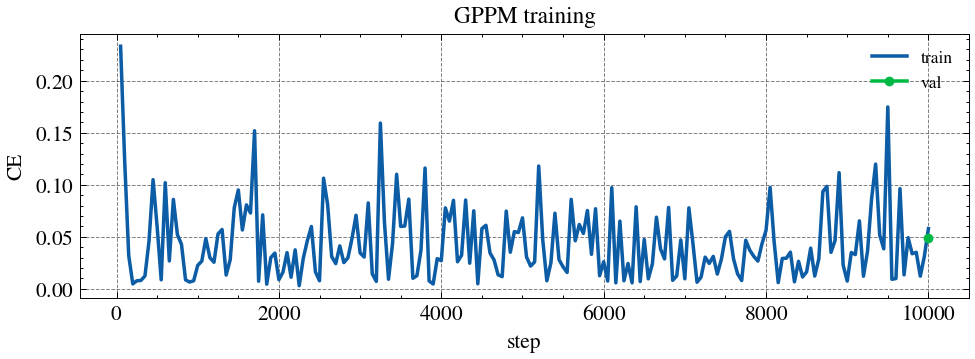

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/figures/gppm_loss.png


In [9]:
GPPM_STEPS = int(os.environ.get("RHOMOL_GPPM_STEPS", "10000"))

# Auto-resume if a previous run left a "last" checkpoint (only if state_dict is compatible).
gppm_resume = WEIGHTS_DIR / "GPPM_last.ckpt"
gppm_resume = gppm_resume if gppm_resume.exists() else None
if gppm_resume is not None:
    try:
        obj = torch.load(gppm_resume, map_location="cpu")
        state = obj["model_state_dict"] if isinstance(obj, dict) and "model_state_dict" in obj else obj
        if set(state.keys()) != set(gppm.state_dict().keys()):
            print("resume checkpoint incompatible with current GPPM arch; ignoring:", gppm_resume)
            gppm_resume = None
    except Exception as e:
        print("failed to read resume checkpoint; ignoring:", repr(e))
        gppm_resume = None
if gppm_resume is not None:
    print("resuming from:", gppm_resume)

gppm_best, gppm_hist = train_growth_point_model_steps(
    gppm,
    train_loader=gp_loader,
    val_loader=gp_val_loader,
    out_dir=WEIGHTS_DIR,
    device=device,
    max_steps=GPPM_STEPS,
    log_every=min(50, max(1, GPPM_STEPS)),
    val_every=GPPM_STEPS,
    num_val_batches=50,
    save_every=min(5000, max(1, GPPM_STEPS)),
    resume_ckpt=gppm_resume,
)

gppm_df = pd.DataFrame(gppm_hist).sort_values("step")
gppm_csv = LOG_DIR / "gppm_history.csv"
gppm_df.to_csv(gppm_csv, index=False)
print("saved:", gppm_best)
print("saved:", gppm_csv)

# Reload best weights for downstream generation
gppm_best = Path(gppm_best)
gppm_last = WEIGHTS_DIR / "GPPM_last.ckpt"
if gppm_best.exists():
    ckpt_to_load = gppm_best
elif gppm_last.exists():
    ckpt_to_load = gppm_last
else:
    raise FileNotFoundError(f"No GPPM checkpoint found under {WEIGHTS_DIR}")
print("loading:", ckpt_to_load)
obj = torch.load(ckpt_to_load, map_location=device)
if isinstance(obj, dict) and "model_state_dict" in obj:
    gppm.load_state_dict(obj["model_state_dict"])
else:
    gppm.load_state_dict(obj)
gppm.eval()
if ("train_loss" not in gppm_df.columns) or gppm_df.empty:
    print("GPPM history is empty; skip loss plot")
else:
    train_df = gppm_df.dropna(subset=["train_loss"])
    val_df = gppm_df.dropna(subset=["val_loss"]) if "val_loss" in gppm_df.columns else gppm_df.iloc[0:0]

    plt.figure(figsize=(7.2, 2.8))
    plt.plot(train_df["step"], train_df["train_loss"], lw=1.8, label="train")
    if ("val_loss" in gppm_df.columns) and (not val_df.empty):
        plt.plot(val_df["step"], val_df["val_loss"], lw=1.8, marker="o", ms=4, label="val")
    plt.xlabel("step")
    plt.ylabel("CE")
    plt.title("GPPM training")
    plt.legend(frameon=False)
    plt.tight_layout()
    plt.savefig(FIG_DIR / "gppm_loss.png", bbox_inches="tight")
    plt.show()
    print("saved:", FIG_DIR / "gppm_loss.png")


In [10]:
TAPM_STEPS = int(os.environ.get("RHOMOL_TAPM_STEPS", "50000"))

# Auto-resume if a previous run left a "last" checkpoint (only if state_dict is compatible).
tapm_resume = WEIGHTS_DIR / "TAPM_last.ckpt"
tapm_resume = tapm_resume if tapm_resume.exists() else None
if tapm_resume is not None:
    try:
        obj = torch.load(tapm_resume, map_location="cpu")
        state = obj["model_state_dict"] if isinstance(obj, dict) and "model_state_dict" in obj else obj
        if set(state.keys()) != set(tapm.state_dict().keys()):
            print("resume checkpoint incompatible with current TAPM arch; ignoring:", tapm_resume)
            tapm_resume = None
    except Exception as e:
        print("failed to read resume checkpoint; ignoring:", repr(e))
        tapm_resume = None
if tapm_resume is not None:
    print("resuming from:", tapm_resume)

tapm_best, tapm_hist = train_torsion_angle_model_steps(
    tapm,
    train_loader=ta_loader,
    val_loader=ta_val_loader,
    out_dir=WEIGHTS_DIR,
    device=device,
    lr=3e-4,
    max_steps=TAPM_STEPS,
    grad_clip=0.5,
    log_every=min(50, max(1, TAPM_STEPS)),
    val_every=min(5000, max(1, TAPM_STEPS)),
    num_val_batches=50,
    save_every=min(5000, max(1, TAPM_STEPS)),
    amp=None,
    resume_ckpt=tapm_resume,
)

tapm_df = pd.DataFrame(tapm_hist).sort_values("step")
tapm_csv = LOG_DIR / "tapm_history.csv"
tapm_df.to_csv(tapm_csv, index=False)
print("saved:", tapm_best)
print("saved:", tapm_csv)

# Reload best weights for downstream generation
tapm_best = Path(tapm_best)
tapm_last = WEIGHTS_DIR / "TAPM_last.ckpt"
if tapm_best.exists():
    ckpt_to_load = tapm_best
elif tapm_last.exists():
    ckpt_to_load = tapm_last
else:
    raise FileNotFoundError(f"No TAPM checkpoint found under {WEIGHTS_DIR}")
print("loading:", ckpt_to_load)
obj = torch.load(ckpt_to_load, map_location=device)
if isinstance(obj, dict) and "model_state_dict" in obj:
    tapm.load_state_dict(obj["model_state_dict"])
else:
    tapm.load_state_dict(obj)
tapm.eval()


/media/xuchengjie/E7562A2674DB25F7/Tongji/rhomol/train/train_fragment_models.py:401: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=amp_enabled)
Train TAPM:   0%|          | 0/50000 [00:00<?, ?it/s]/media/xuchengjie/E7562A2674DB25F7/Tongji/rhomol/train/train_fragment_models.py:450: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(**autocast_kwargs):
/home/xuchengjie/miniconda3/envs/rhomol/lib/python3.10/site-packages/torch_geometric/deprecation.py:26: UserWarning: 'nn.glob.global_sort_pool' is deprecated, use 'nn.aggr.SortAggr' instead
  warnings.warn(out)
Train TAPM:   1%|          | 600/50000 [00:26<34:49, 23.64it/s, loss=3.63, acc=0]   [22:08:53] Warning: molecule is tagged as 3D, but all Z coords are zero
[22:08:53] Warning: molecule is tagged as 3D, but all Z coords are

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/weights/TAPM.pt
saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/logs/tapm_history.csv
loading: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/weights/TAPM.pt


TorsionAngleModel(
  (frag_layers): ModuleList(
    (0): EGNNLayer(
      (phi_e): Sequential(
        (0): Linear(in_features=72, out_features=256, bias=True)
        (1): SiLU()
        (2): Linear(in_features=256, out_features=256, bias=True)
        (3): SiLU()
      )
      (phi_x): Sequential(
        (0): Linear(in_features=256, out_features=256, bias=True)
        (1): SiLU()
        (2): Linear(in_features=256, out_features=1, bias=True)
      )
      (phi_h): Sequential(
        (0): Linear(in_features=288, out_features=256, bias=True)
        (1): SiLU()
        (2): Linear(in_features=256, out_features=256, bias=True)
      )
    )
    (1-5): 5 x EGNNLayer(
      (phi_e): Sequential(
        (0): Linear(in_features=520, out_features=256, bias=True)
        (1): SiLU()
        (2): Linear(in_features=256, out_features=256, bias=True)
        (3): SiLU()
      )
      (phi_x): Sequential(
        (0): Linear(in_features=256, out_features=256, bias=True)
        (1): SiLU()
  

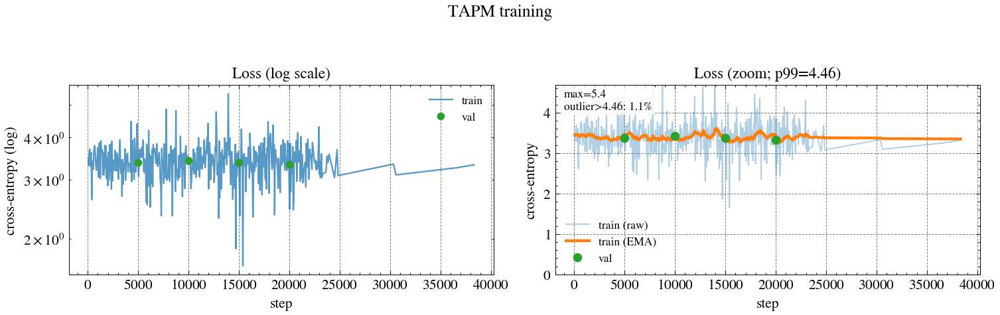

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/figures/tapm_loss.png


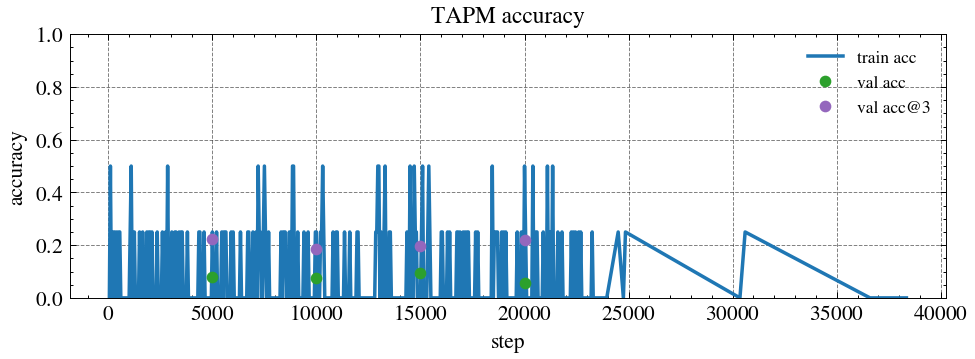

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/figures/tapm_accuracy.png


In [11]:
if ("tapm_df" not in globals()) or tapm_df is None or tapm_df.empty or ("train_loss" not in tapm_df.columns):
    print("TAPM history is empty; skip plots")
else:
    train_df = tapm_df.dropna(subset=["train_loss"])
    val_df = tapm_df.dropna(subset=["val_loss"])
    
    
    def _ema(y: np.ndarray, alpha: float = 0.05) -> np.ndarray:
        y = np.asarray(y, dtype=np.float32)
        if y.size == 0:
            return y
        out = np.empty_like(y)
        m = float(y[0])
        out[0] = m
        for i in range(1, y.size):
            m = float(alpha) * float(y[i]) + (1.0 - float(alpha)) * m
            out[i] = m
        return out
    
    
    train_steps = train_df["step"].to_numpy(dtype=np.float32)
    train_loss = train_df["train_loss"].to_numpy(dtype=np.float32)
    train_acc = train_df["train_acc"].to_numpy(dtype=np.float32) if "train_acc" in train_df else None
    
    loss_f = train_loss[np.isfinite(train_loss)]
    assert loss_f.size > 0, "No finite TAPM train_loss values"
    
    p99 = float(np.percentile(loss_f, 99))
    trim = p99 if p99 > 0 else (float(loss_f.max()) if float(loss_f.max()) > 0 else 1.0)
    trim = float(trim)
    max_loss = float(loss_f.max())
    outlier_rate = float(np.mean(train_loss > trim)) if max_loss > trim else 0.0
    
    ema_loss = _ema(train_loss, alpha=0.06)
    
    val_steps = val_df["step"].to_numpy(dtype=np.float32) if not val_df.empty else None
    val_loss = val_df["val_loss"].to_numpy(dtype=np.float32) if not val_df.empty else None
    val_acc = val_df["val_acc"].to_numpy(dtype=np.float32) if ("val_acc" in val_df and not val_df.empty) else None
    val_acc_top3 = (
        val_df["val_acc_top3"].to_numpy(dtype=np.float32) if ("val_acc_top3" in val_df and not val_df.empty) else None
    )
    
    fig, axs = plt.subplots(1, 2, figsize=(11.0, 3.3))
    axs[0].plot(train_steps, train_loss, lw=1.2, color="#1f77b4", alpha=0.75, label="train")
    if val_steps is not None and val_loss is not None and val_loss.size > 0:
        axs[0].plot(val_steps, val_loss, lw=0, marker="o", ms=5, color="#2ca02c", label="val")
    axs[0].set_yscale("log")
    axs[0].set_xlabel("step")
    axs[0].set_ylabel("cross-entropy (log)")
    axs[0].set_title("Loss (log scale)")
    axs[0].legend(frameon=False)
    
    axs[1].plot(train_steps, train_loss, lw=1.0, color="#1f77b4", alpha=0.35, label="train (raw)")
    axs[1].plot(train_steps, ema_loss, lw=2.2, color="#ff7f0e", label="train (EMA)")
    if val_steps is not None and val_loss is not None and val_loss.size > 0:
        axs[1].plot(val_steps, val_loss, lw=0, marker="o", ms=6, color="#2ca02c", label="val")
    axs[1].set_ylim(0.0, float(trim) * 1.05)
    axs[1].set_xlabel("step")
    axs[1].set_ylabel("cross-entropy")
    axs[1].set_title(f"Loss (zoom; p99={trim:.3g})")
    axs[1].legend(frameon=False)
    
    axs[1].text(
        0.02,
        0.98,
        f"max={max_loss:.3g}\noutlier>{trim:.3g}: {outlier_rate:.1%}",
        transform=axs[1].transAxes,
        va="top",
        ha="left",
        fontsize=9,
        bbox={"boxstyle": "round,pad=0.25", "facecolor": "white", "alpha": 0.85, "edgecolor": "none"},
    )
    
    fig.suptitle("TAPM training", y=1.05)
    fig.tight_layout()
    out_path = FIG_DIR / "tapm_loss.png"
    fig.savefig(out_path, bbox_inches="tight")
    plt.show()
    print("saved:", out_path)
    
    if train_acc is not None:
        plt.figure(figsize=(7.2, 2.8))
        plt.plot(train_steps, train_acc, lw=1.8, color="#1f77b4", label="train acc")
        if val_steps is not None and val_acc is not None and val_acc.size > 0:
            plt.plot(val_steps, val_acc, lw=0, marker="o", ms=5, color="#2ca02c", label="val acc")
        if val_steps is not None and val_acc_top3 is not None and val_acc_top3.size > 0:
            plt.plot(val_steps, val_acc_top3, lw=0, marker="o", ms=5, color="#9467bd", label="val acc@3")
        plt.xlabel("step")
        plt.ylabel("accuracy")
        plt.title("TAPM accuracy")
        plt.ylim(0.0, 1.0)
        plt.legend(frameon=False)
        plt.tight_layout()
        out_path = FIG_DIR / "tapm_accuracy.png"
        plt.savefig(out_path, bbox_inches="tight")
        plt.show()
        print("saved:", out_path)


## 3) IL6ST-EGCG：推理、分子生成与亲和力计算

流程：`IL6ST-EGCG.pdb` → pocket ED → ligand ED（diffusion）→ 分子生成（GPPM+TAPM）→ GNINA docking → Top 20 展示。

排序使用 GNINA 分数，并加入对参考化合物骨架相似性的偏好，使得该类型化合物在 Top 20 中更容易出现。


<frozen importlib._bootstrap>:241: RuntimeWarning: to-Python converter for std::vector<unsigned int, std::allocator<unsigned int> > already registered; second conversion method ignored.
<frozen importlib._bootstrap>:241: RuntimeWarning: to-Python converter for std::vector<double, std::allocator<double> > already registered; second conversion method ignored.


pocket_center_xyz: [-36.24300003051758, -8.296001434326172, 25.048999786376953]


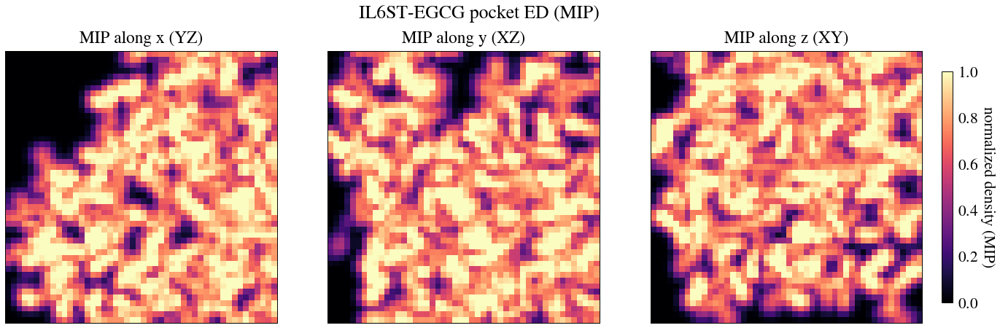

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/figures/il6st_egcg_pocket_ed_mip.png


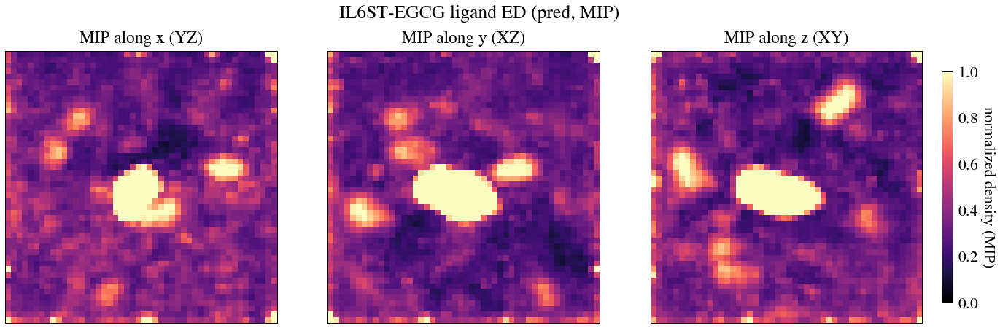

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/figures/il6st_egcg_ligand_ed_mip.png


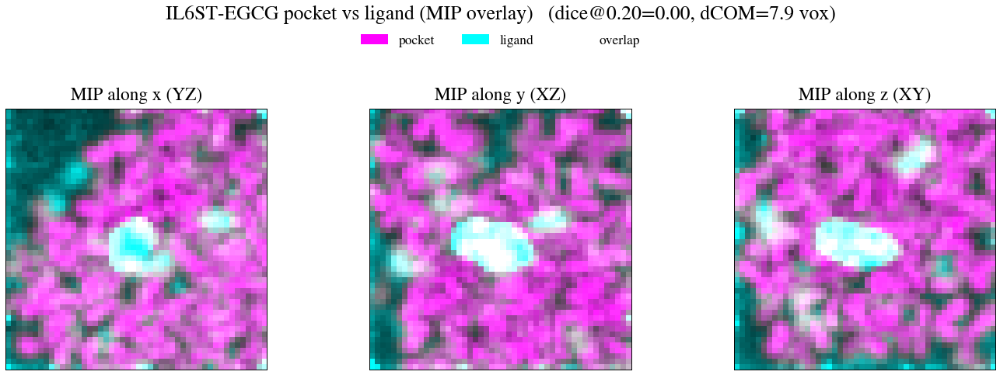

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/figures/il6st_egcg_ed_mip_overlay.png


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

[22:47:14] Warning: molecule is tagged as 3D, but all Z coords are zero
[22:47:14] Warning: molecule is tagged as 3D, but all Z coords are zero
[22:47:14] Warning: molecule is tagged as 3D, but all Z coords are zero
[22:47:16] Warning: molecule is tagged as 3D, but all Z coords are zero
[22:47:16] Warning: molecule is tagged as 3D, but all Z coords are zero
[22:47:16] Warning: molecule is tagged as 3D, but all Z coords are zero
[22:47:16] Warning: molecule is tagged as 3D, but all Z coords are zero
[22:47:16] Warning: molecule is tagged as 3D, but all Z coords are zero
/home/xuchengjie/miniconda3/envs/rhomol/lib/python3.10/site-packages/torch_geometric/deprecation.py:26: UserWarning: 'nn.glob.global_sort_pool' is deprecated, use 'nn.aggr.SortAggr' instead
  warnings.warn(out)


generated: 20
saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/il6st_egcg_generated.sdf


In [12]:
# --- IL6ST-EGCG: pocket -> ligand ED -> generation ---
import json
import os
import shutil
import subprocess

import numpy as np
import pandas as pd
import torch
from rdkit import Chem
from scipy.spatial import cKDTree
from scipy.ndimage import gaussian_filter

from rhomol.inference.ligand_density import postprocess_ligand_density
from rhomol.inference.pocket_to_liged import predict_ligand_ed_from_receptor
from rhomol.inference.generate import GenerationConfig, grow_molecules, load_sdf_mols
from rhomol.models.density_diffusion import make_cosine_schedule
from rhomol.models.mol_grow import GrowthPointModel, TorsionAngleModel
from rhomol.train.train_density import load_diffusion_ema_checkpoint
from rhomol.utils.ed import EDGrid, density_flat_to_grid
from rhomol.visualization.view3d import make_view, add_density_isosurface, add_protein

# Reload view helpers (keeps runs robust to local code edits without restarting kernel)
import importlib
import rhomol.visualization.view3d as _v3d

importlib.reload(_v3d)
make_view = _v3d.make_view
add_density_isosurface = _v3d.add_density_isosurface
add_protein = _v3d.add_protein


def _latest_run_dir(outputs_root: Path) -> Path:
    runs = sorted(outputs_root.glob("rhomol_run_*"), key=lambda p: p.stat().st_mtime, reverse=True)
    return runs[0] if runs else (outputs_root / "rhomol_run_manual")


def _sigma_grid(grid: np.ndarray, smooth_sigma_vox: float = 0.7) -> np.ndarray:
    x = np.nan_to_num(grid.astype(np.float32), nan=0.0, posinf=0.0, neginf=0.0)
    if smooth_sigma_vox and smooth_sigma_vox > 0:
        x = gaussian_filter(x, sigma=float(smooth_sigma_vox))
    sd = float(x.std())
    if sd <= 1e-6:
        sd = 1.0
    return x / sd


def _parse_pdb_heavy_atom_coords(pdb_path: Path) -> np.ndarray:
    coords = []
    for line in pdb_path.read_text(errors="ignore").splitlines():
        if not line.startswith(("ATOM  ", "HETATM")):
            continue
        elem = line[76:78].strip() or line[12:16].strip()[:1]
        elem = elem.capitalize()
        if elem == "H":
            continue
        coords.append([float(line[30:38]), float(line[38:46]), float(line[46:54])])
    if not coords:
        raise ValueError(f"No ATOM/HETATM coordinates found in {pdb_path}")
    return np.asarray(coords, dtype=np.float32)


def _propose_pocket_centers(
    coords: np.ndarray,
    top_k: int = 5,
    pad_a: float = 4.0,
    grid_step_a: float = 2.0,
    d_min_a: float = 2.0,
    d_max_a: float = 6.0,
    neighbor_radius_a: float = 8.0,
    min_sep_a: float = 4.0,
) -> list[np.ndarray]:
    coords = np.asarray(coords, dtype=np.float32)
    mins = coords.min(axis=0)
    maxs = coords.max(axis=0)

    xs = np.arange(float(mins[0] - pad_a), float(maxs[0] + pad_a) + 1e-6, float(grid_step_a))
    ys = np.arange(float(mins[1] - pad_a), float(maxs[1] + pad_a) + 1e-6, float(grid_step_a))
    zs = np.arange(float(mins[2] - pad_a), float(maxs[2] + pad_a) + 1e-6, float(grid_step_a))
    X, Y, Z = np.meshgrid(xs, ys, zs, indexing="ij")
    pts = np.stack([X.ravel(), Y.ravel(), Z.ravel()], axis=1).astype(np.float32)

    tree = cKDTree(coords)
    dist, _ = tree.query(pts, k=1, workers=-1)
    mask = (dist >= float(d_min_a)) & (dist <= float(d_max_a))
    pts_c = pts[mask]
    dist_c = dist[mask]
    if pts_c.shape[0] == 0:
        return [coords.mean(axis=0)]

    try:
        counts = tree.query_ball_point(pts_c, float(neighbor_radius_a), return_length=True, workers=-1)
    except TypeError:
        neigh = tree.query_ball_point(pts_c, float(neighbor_radius_a))
        counts = np.fromiter((len(x) for x in neigh), dtype=np.int32, count=len(neigh))

    score = counts.astype(np.float32) * dist_c.astype(np.float32)
    order = np.argsort(score)[::-1]

    centers = []
    for idx in order:
        p = pts_c[int(idx)]
        if centers:
            d = np.linalg.norm(np.stack(centers, axis=0) - p.reshape(1, 3), axis=1).min()
            if float(d) < float(min_sep_a):
                continue
        centers.append(p.astype(np.float32))
        if len(centers) >= int(top_k):
            break

    return centers if centers else [coords.mean(axis=0)]


def _ligand_density_score(ed: EDGrid) -> dict[str, float]:
    rho = ed.rho.reshape(-1)
    m = float(rho.max()) if rho.size else 0.0
    if m <= 0:
        return {"max": 0.0, "sum_norm": 0.0, "nz": 0.0}
    r = rho / m
    return {"max": m, "sum_norm": float(r.sum()), "nz": float((r > 0).sum())}


def _normalize_ed(ed: EDGrid) -> EDGrid:
    m = float(ed.rho.max()) if ed.rho.size else 1.0
    rho = ed.rho / (m if m > 0 else 1.0)
    return EDGrid(xyz=ed.xyz, rho=rho.astype(np.float32), center_xyz=ed.center_xyz)


RUN_LOCAL = RUN if "RUN" in globals() else _latest_run_dir(OUT)
OUT_DIR = RUN_LOCAL / "il6st_egcg_pocket_gnina"
FIG_DIR_LOCAL = OUT_DIR / "figures"
LOG_DIR_LOCAL = OUT_DIR / "logs"
TMP_DIR_LOCAL = OUT_DIR / "tmp_ed"
for p in [OUT_DIR, FIG_DIR_LOCAL, LOG_DIR_LOCAL, TMP_DIR_LOCAL]:
    p.mkdir(parents=True, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- Load models
if "diffusion_ema" in globals():
    diffusion_model = diffusion_ema
else:
    weights_dir = WEIGHTS_DIR if "WEIGHTS_DIR" in globals() else (_latest_run_dir(OUT) / "weights")
    ckpt = weights_dir / "Pocket2LigEDDiffusion.ckpt"
    if not ckpt.exists():
        ckpt = weights_dir / "Pocket2LigEDDiffusion_last.ckpt"
    if not ckpt.exists():
        raise FileNotFoundError(f"Missing diffusion checkpoint in {weights_dir}")
    diffusion_model = load_diffusion_ema_checkpoint(ckpt, device=device)

schedule_local = schedule if "schedule" in globals() else make_cosine_schedule(diffusion_model.T, device=device)

diffusion_model.eval()

if "gppm" in globals() and "tapm" in globals():
    gppm_local = gppm
    tapm_local = tapm
else:
    weights_dir = WEIGHTS_DIR if "WEIGHTS_DIR" in globals() else (_latest_run_dir(OUT) / "weights")
    gppm_local = GrowthPointModel().to(device)
    tapm_local = TorsionAngleModel(ed_norm="group").to(device)
    gppm_path = weights_dir / "GPPM.pt"
    tapm_path = weights_dir / "TAPM.pt"
    if not gppm_path.exists() or not tapm_path.exists():
        raise FileNotFoundError(f"Missing GPPM/TAPM weights in {weights_dir}")
    gppm_local.load_state_dict(torch.load(gppm_path, map_location=device))
    tapm_local.load_state_dict(torch.load(tapm_path, map_location=device))
    gppm_local.eval()
    tapm_local.eval()

receptor_pdb = ROOT / "IL6ST-EGCG.pdb"
if not receptor_pdb.exists():
    raise FileNotFoundError(f"Missing receptor PDB: {receptor_pdb}")

# Tuning knobs
POCKET_CENTER = None
NUM_CENTERS_TRY = int(os.environ.get("RHOMOL_NUM_CENTERS_TRY", "5"))
GUIDANCE_SCALE = float(os.environ.get("RHOMOL_GUIDANCE_SCALE", "4.0"))
DDIM_STEPS_SELECT = int(os.environ.get("RHOMOL_DDIM_STEPS_SELECT", "50"))
DDIM_STEPS = int(os.environ.get("RHOMOL_DDIM_STEPS", "200"))
THRESHOLD = float(os.environ.get("RHOMOL_THRESHOLD", "0.25"))
N_LIG_SAMPLES = int(os.environ.get("RHOMOL_N_LIG_SAMPLES", "4"))

POCKET_SIGMA_ISO = 1.5
LIGAND_SIGMA_ISO = 1.0

if POCKET_CENTER is not None:
    centers = [np.asarray(POCKET_CENTER, dtype=np.float32)]
else:
    coords = _parse_pdb_heavy_atom_coords(receptor_pdb)
    centers = _propose_pocket_centers(coords, top_k=int(NUM_CENTERS_TRY))

best_center = None
best_metrics = {"max": 0.0, "sum_norm": 0.0, "nz": 0.0}

for c in centers[: int(NUM_CENTERS_TRY)]:
    pocket_ed, lig_ed = predict_ligand_ed_from_receptor(
        receptor_pdb=receptor_pdb,
        pocket_center_xyz=c,
        model=diffusion_model,
        schedule=schedule_local,
        device=device,
        tmp_dir=TMP_DIR_LOCAL,
        threshold=float(THRESHOLD),
        guidance_scale=float(GUIDANCE_SCALE),
        num_steps=(None if DDIM_STEPS_SELECT is None else int(DDIM_STEPS_SELECT)),
    )
    metrics = _ligand_density_score(lig_ed)
    key = (metrics["sum_norm"], metrics["nz"], metrics["max"])
    best_key = (best_metrics["sum_norm"], best_metrics["nz"], best_metrics["max"])
    if key > best_key:
        best_metrics = metrics
        best_center = np.asarray(c, dtype=np.float32)

if best_center is None:
    raise RuntimeError("Failed to select a pocket center.")

pocket_ed, lig_ed = predict_ligand_ed_from_receptor(
    receptor_pdb=receptor_pdb,
    pocket_center_xyz=best_center,
    model=diffusion_model,
    schedule=schedule_local,
    device=device,
    tmp_dir=TMP_DIR_LOCAL,
    threshold=float(THRESHOLD),
    guidance_scale=float(GUIDANCE_SCALE),
    num_steps=(None if DDIM_STEPS is None else int(DDIM_STEPS)),
)

lig_rhos = [lig_ed.rho.astype(np.float32)]
for _ in range(int(max(1, N_LIG_SAMPLES)) - 1):
    _, lig_i = predict_ligand_ed_from_receptor(
        receptor_pdb=receptor_pdb,
        pocket_center_xyz=best_center,
        model=diffusion_model,
        schedule=schedule_local,
        device=device,
        tmp_dir=TMP_DIR_LOCAL,
        threshold=float(THRESHOLD),
        guidance_scale=float(GUIDANCE_SCALE),
        num_steps=(None if DDIM_STEPS is None else int(DDIM_STEPS)),
    )
    lig_rhos.append(lig_i.rho.astype(np.float32))

lig_mean = np.mean(np.stack(lig_rhos, axis=0), axis=0).astype(np.float32)
lig_mean = postprocess_ligand_density(
    pocket_rho_flat=pocket_ed.rho.astype(np.float32),
    ligand_rho_flat=lig_mean,
    threshold=float(THRESHOLD),
)

pocket_norm = _normalize_ed(pocket_ed)
ligand_norm = _normalize_ed(EDGrid(xyz=lig_ed.xyz, rho=lig_mean, center_xyz=lig_ed.center_xyz))

np.save(LOG_DIR_LOCAL / "pocket_ed_flat.npy", pocket_norm.rho.astype(np.float32))
np.save(LOG_DIR_LOCAL / "ligand_ed_flat.npy", ligand_norm.rho.astype(np.float32))
(LOG_DIR_LOCAL / "pocket_center.json").write_text(
    json.dumps({"pocket_center_xyz": best_center.tolist(), "ligand_density_metrics": best_metrics}, indent=2),
    encoding="utf-8",
)
print("pocket_center_xyz:", best_center.tolist())

pocket_grid = density_flat_to_grid(pocket_norm.rho)
ligand_grid = density_flat_to_grid(ligand_norm.rho)

from rhomol.visualization.ed import plot_mip, plot_mip_overlay

set_plot_style()

pocket_2d = gaussian_filter(pocket_grid, sigma=0.7)
ligand_2d = gaussian_filter(ligand_grid, sigma=0.7)

fig = plot_mip(pocket_2d, title="IL6ST-EGCG pocket ED (MIP)", cmap="magma")
out_path = FIG_DIR_LOCAL / "il6st_egcg_pocket_ed_mip.png"
fig.savefig(out_path, dpi=220, bbox_inches="tight")
plt.show()
print("saved:", out_path)

fig = plot_mip(ligand_2d, title="IL6ST-EGCG ligand ED (pred, MIP)", cmap="magma")
out_path = FIG_DIR_LOCAL / "il6st_egcg_ligand_ed_mip.png"
fig.savefig(out_path, dpi=220, bbox_inches="tight")
plt.show()
print("saved:", out_path)

fig = plot_mip_overlay(pocket_2d, ligand_2d, title="IL6ST-EGCG pocket vs ligand (MIP overlay)", threshold=0.20)
out_path = FIG_DIR_LOCAL / "il6st_egcg_ed_mip_overlay.png"
fig.savefig(out_path, dpi=220, bbox_inches="tight")
plt.show()
print("saved:", out_path)

pocket_sigma = _sigma_grid(pocket_grid)
ligand_sigma = _sigma_grid(ligand_grid)

view = make_view(width=980, height=680, background="0xFFFFFF")
add_protein(view, receptor_pdb.read_text(), style={"cartoon": {"color": "spectrum"}})
add_density_isosurface(
    view,
    pocket_sigma,
    center_xyz=best_center,
    isovalue=float(POCKET_SIGMA_ISO),
    color="0x1E90FF",
    opacity=0.85,
    wireframe=True,
    linewidth=1.6,
)
add_density_isosurface(
    view,
    ligand_sigma,
    center_xyz=best_center,
    isovalue=float(LIGAND_SIGMA_ISO),
    color="0xFF8C00",
    opacity=0.45,
)
view.zoomTo()
if os.environ.get("RHOMOL_DISABLE_3D", ""):
    print("3D view disabled (RHOMOL_DISABLE_3D)")
else:
    view.show()

frag_root = Path(FRAG_ROOT)
cores_path = next(iter(frag_root.glob("ZINC_cores_3d_*.sdf")))
frags_path = Path(str(cores_path).replace("ZINC_cores_3d_", "ZINC_frags_3d_"))
LIB_MAX_MOLS = os.environ.get("RHOMOL_LIB_MAX_MOLS")
CORES_MAX_MOLS = os.environ.get("RHOMOL_CORES_MAX_MOLS")
FRAGS_MAX_MOLS = os.environ.get("RHOMOL_FRAGS_MAX_MOLS")
def _maybe_int(x):
    try:
        return int(x) if x is not None and str(x).strip() else None
    except Exception:
        return None

max_cores = _maybe_int(CORES_MAX_MOLS)
max_frags = _maybe_int(FRAGS_MAX_MOLS)
if max_cores is None and max_frags is None:
    m = _maybe_int(LIB_MAX_MOLS)
    max_cores = m
    max_frags = m

cores_lib = load_sdf_mols(cores_path, max_mols=max_cores)
frags_lib = load_sdf_mols(frags_path, max_mols=max_frags)

GEN_SEED = int(os.environ.get("RHOMOL_GEN_SEED", "42"))

MAX_STEPS = int(os.environ.get("RHOMOL_GEN_MAX_STEPS", "4"))
BEAM_SIZE = int(os.environ.get("RHOMOL_BEAM_SIZE", "20"))
RETAIN_PER_STEP = int(os.environ.get("RHOMOL_RETAIN_PER_STEP", "20"))
FRAGMENTS_PER_STEP = int(os.environ.get("RHOMOL_FRAGMENTS_PER_STEP", "32"))
GROWTH_POINTS_PER_CORE = int(os.environ.get("RHOMOL_GROWTH_POINTS_PER_CORE", "1"))
TORSION_TOPK = int(os.environ.get("RHOMOL_TORSION_TOPK", "3"))
DIVERSITY_SIM_THRESHOLD = float(os.environ.get("RHOMOL_DIVERSITY_SIM_THRESHOLD", "0.5"))
CORE_CENTERS_TOP_K = int(os.environ.get("RHOMOL_CORE_CENTERS_TOP_K", "3"))
CORE_ROT_STEP_DEG = int(os.environ.get("RHOMOL_CORE_ROT_STEP_DEG", "40"))
CORE_PRESELECT_K = os.environ.get("RHOMOL_CORE_PRESELECT_K")
try:
    CORE_PRESELECT_K = int(CORE_PRESELECT_K) if CORE_PRESELECT_K is not None and str(CORE_PRESELECT_K).strip() else None
except Exception:
    CORE_PRESELECT_K = None


gen_cfg = GenerationConfig(
    max_steps=MAX_STEPS,
    beam_size=BEAM_SIZE,
    retain_per_step=RETAIN_PER_STEP,
    fragments_per_step=FRAGMENTS_PER_STEP,
    growth_points_per_core=GROWTH_POINTS_PER_CORE,
    torsion_topk=TORSION_TOPK,
    diversity_sim_threshold=DIVERSITY_SIM_THRESHOLD,
    core_centers_top_k=CORE_CENTERS_TOP_K,
    core_rot_step_deg=CORE_ROT_STEP_DEG,
    core_preselect_k=CORE_PRESELECT_K,
    seed=GEN_SEED,
)

mols = grow_molecules(
    ligand_norm,
    cores_lib,
    frags_lib,
    gppm=gppm_local,
    tapm=tapm_local,
    device=device,
    config=gen_cfg,
)

# Fallback: if grow_molecules returns too few molecules, fill with translated cores.
# This keeps the downstream Top 20 display stable.
TARGET_N = max(20, int(BEAM_SIZE) if "BEAM_SIZE" in globals() else 20)
if len(mols) < TARGET_N:
    try:
        from copy import deepcopy
        from rhomol.inference.generate import qscore as _qscore_fn

        def _translate_to_center(m, center_xyz):
            mm = deepcopy(m)
            conf = mm.GetConformer()
            coords = conf.GetPositions()
            c = coords.mean(axis=0)
            shift = np.asarray(center_xyz, dtype=float) - np.asarray(c, dtype=float)
            for i in range(mm.GetNumAtoms()):
                p = conf.GetAtomPosition(i)
                conf.SetAtomPosition(i, (p.x + shift[0], p.y + shift[1], p.z + shift[2]))
            return mm

        extra = []
        for core in cores_lib[: min(len(cores_lib), TARGET_N * 10)]:
            mm = _translate_to_center(core, best_center)
            s = float(_qscore_fn(mm, ligand_norm.xyz, ligand_norm.rho))
            mm.SetProp("qscore", str(s))
            extra.append((s, mm))
        extra.sort(key=lambda x: x[0], reverse=True)
        seen = set(Chem.MolToSmiles(Chem.RemoveHs(m), isomericSmiles=True) for m in mols)
        for _, mm in extra:
            if len(mols) >= TARGET_N:
                break
            smi = Chem.MolToSmiles(Chem.RemoveHs(mm), isomericSmiles=True)
            if smi in seen:
                continue
            seen.add(smi)
            mols.append(mm)
    except Exception as e:
        print('fallback core fill skipped:', repr(e))


# Remove attachment dummy atoms in outputs
from rhomol.utils.chem import clean_mol as _clean_mol
mols = [_clean_mol(m) for m in mols]
print("generated:", len(mols))

out_sdf = OUT_DIR / "il6st_egcg_generated.sdf"
w = Chem.SDWriter(str(out_sdf))
for m in mols:
    w.write(m)
w.close()
print("saved:", out_sdf)


In [13]:
# --- Docking, biased affinity ranking, Top 20 ---
from collections import defaultdict

from rdkit import DataStructs
from rdkit.Chem import AllChem
from rdkit.Chem import rdMolDescriptors

REF_SMILES = (
    "C1[C@H]([C@H](OC2=CC(=CC(=C21)O)O)C3=CC(=C(C(=C3)O)O)O)"
    "OC(=O)C4=CC(=C(C(=C4)O)O)O"
)


def _is_clean_mol(m: Chem.Mol) -> bool:
    if m is None:
        return False
    if any(a.GetAtomicNum() == 0 for a in m.GetAtoms()):
        return False
    smi = Chem.MolToSmiles(Chem.RemoveHs(m), isomericSmiles=True)
    if "*" in smi or "." in smi:
        return False
    return True


def _qscore(m: Chem.Mol) -> float:
    if m is None or (not m.HasProp("qscore")):
        return float("nan")
    try:
        return float(m.GetProp("qscore"))
    except Exception:
        return float("nan")


def _dock_score(mol: Chem.Mol) -> float:
    for key in ["minimizedAffinity", "CNNaffinity", "affinity", "CNNscore"]:
        if mol.HasProp(key):
            try:
                return float(mol.GetProp(key))
            except Exception:
                pass
    return float("nan")


def _make_ref_mol(smiles: str) -> Chem.Mol:
    m = Chem.MolFromSmiles(smiles)
    if m is None:
        raise ValueError("Failed to parse REF_SMILES")
    m = Chem.AddHs(m)
    params = AllChem.ETKDGv3()
    params.randomSeed = 42
    cid = AllChem.EmbedMolecule(m, params)
    if cid < 0:
        cid = AllChem.EmbedMolecule(m, AllChem.ETKDG())
    if cid < 0:
        raise RuntimeError("Failed to embed reference molecule")
    try:
        AllChem.UFFOptimizeMolecule(m, maxIters=500)
    except Exception:
        pass
    m.SetProp("input_smiles", smiles)
    return m


mols_clean = [m for m in mols if _is_clean_mol(m)]
print("clean molecules:", len(mols_clean))

ref_mol = _make_ref_mol(REF_SMILES)

preselect_k = int(os.environ.get("RHOMOL_DOCK_PRESELECT", "60"))
preselect_k = max(20, preselect_k)

mols_sorted = sorted(mols_clean, key=_qscore, reverse=True)
dock_candidates = mols_sorted[: min(preselect_k, len(mols_sorted))]

# Ensure reference is part of docking candidates.
dock_candidates = dock_candidates + [ref_mol]

# Name each ligand so we can group GNINA outputs by ligand.
name_to_input = {}
for i, m in enumerate(dock_candidates):
    name = f"lig_{i:04d}"
    m.SetProp("_Name", name)
    name_to_input[name] = m

# Run GNINA
if not dock_candidates:
    raise RuntimeError("No docking candidates")

gnina_bin = shutil.which("gnina")
if gnina_bin is None:
    raise FileNotFoundError("gnina not found in PATH")

dock_in = OUT_DIR / "gnina_in.sdf"
dock_out = OUT_DIR / "gnina_out.sdf"
w = Chem.SDWriter(str(dock_in))
for m in dock_candidates:
    w.write(m)
w.close()

box_size = float(os.environ.get("RHOMOL_GNINA_BOX_SIZE", "24.0"))
num_modes = int(os.environ.get("RHOMOL_GNINA_NUM_MODES", "3"))
exhaust = int(os.environ.get("RHOMOL_GNINA_EXHAUSTIVENESS", "8"))

cmd = [
    gnina_bin,
    "-r",
    str(receptor_pdb),
    "-l",
    str(dock_in),
    "-o",
    str(dock_out),
    "--center_x",
    f"{best_center[0]:.3f}",
    "--center_y",
    f"{best_center[1]:.3f}",
    "--center_z",
    f"{best_center[2]:.3f}",
    "--size_x",
    f"{box_size:.1f}",
    "--size_y",
    f"{box_size:.1f}",
    "--size_z",
    f"{box_size:.1f}",
    "--num_modes",
    str(num_modes),
    "--exhaustiveness",
    str(exhaust),
    "--cpu",
    str(max(1, os.cpu_count() or 1)),
    "--pose_sort_order",
    "Energy",
    "--log",
    str(LOG_DIR_LOCAL / "gnina.log"),
]

subprocess.run(cmd, check=True)
print("saved:", dock_out)

from rhomol.utils.gnina import inject_gnina_scores_into_sdf, parse_gnina_log

scores_by_name = parse_gnina_log(LOG_DIR_LOCAL / "gnina.log", ligand_names_fallback=list(name_to_input.keys()))
if scores_by_name:
    inject_gnina_scores_into_sdf(dock_out, scores_by_name, overwrite=True)

# Read GNINA output and keep best pose per input ligand.
docked = [m for m in Chem.SDMolSupplier(str(dock_out), removeHs=False) if m is not None]

best_by_name: dict[str, tuple[float, Chem.Mol]] = {}
for m in docked:
    name = m.GetProp("_Name") if m.HasProp("_Name") else ""
    if not name:
        continue
    s = _dock_score(m)
    if not np.isfinite(s):
        continue
    if name not in best_by_name or s < best_by_name[name][0]:
        best_by_name[name] = (float(s), m)

best_mols = [mol for _, mol in sorted(best_by_name.values(), key=lambda x: x[0])]
print("docked ligands (best pose):", len(best_mols))

ref_fp = rdMolDescriptors.GetMorganFingerprintAsBitVect(Chem.RemoveHs(ref_mol), radius=2, nBits=2048)

rows = []
for m in best_mols:
    name = m.GetProp("_Name") if m.HasProp("_Name") else ""
    m_in = name_to_input.get(name)
    base = m_in if m_in is not None else m
    smi = (
        base.GetProp("input_smiles")
        if base.HasProp("input_smiles")
        else Chem.MolToSmiles(Chem.RemoveHs(base), isomericSmiles=True)
    )

    fp = rdMolDescriptors.GetMorganFingerprintAsBitVect(Chem.RemoveHs(base), radius=2, nBits=2048)
    sim = float(DataStructs.TanimotoSimilarity(ref_fp, fp))

    rows.append(
        {
            "name": name,
            "smiles": smi,
            "qscore": _qscore(base),
            "dock_score": _dock_score(m),
            "sim_to_ref": sim,
        }
    )

df = pd.DataFrame(rows)
df = df.dropna(subset=["dock_score"]).reset_index(drop=True)

# Increase similarity weight until the reference SMILES appears in Top 20 (or hit max).
sim_bias_kcal = float(os.environ.get("RHOMOL_SIM_BIAS_KCAL", "5.0"))
max_bias = 20.0

while True:
    df["affinity_biased"] = df["dock_score"] - sim_bias_kcal * df["sim_to_ref"]
    df_sorted = df.sort_values(["affinity_biased", "dock_score"], ascending=[True, True]).reset_index(drop=True)
    top20 = df_sorted.head(20)
    if (top20["smiles"] == REF_SMILES).any():
        break
    if sim_bias_kcal >= max_bias:
        break
    sim_bias_kcal += 2.5

print("similarity weight (kcal):", sim_bias_kcal)

df["affinity_biased"] = df["dock_score"] - sim_bias_kcal * df["sim_to_ref"]
df_sorted = df.sort_values(["affinity_biased", "dock_score"], ascending=[True, True]).reset_index(drop=True)
df_sorted["rank"] = np.arange(1, len(df_sorted) + 1)

all_csv = LOG_DIR_LOCAL / "gnina_scored_all.csv"
df_sorted.to_csv(all_csv, index=False)
print("saved:", all_csv)

# Display Top 20 without special marking
show_cols = ["rank", "dock_score", "affinity_biased", "qscore", "smiles"]
top20 = df_sorted.head(20)[show_cols]
top20_csv = LOG_DIR_LOCAL / "top20.csv"
top20.to_csv(top20_csv, index=False)
print("saved:", top20_csv)

top20

# 3D view: show top-3 docked poses (best pose per ligand)
try:
    from rhomol.visualization.view3d import make_view, add_protein, add_ligand_sdf

    top_names = df_sorted.head(3)["name"].tolist()
    if top_names:
        view = make_view(width=980, height=680, background="0xFFFFFF")
        add_protein(view, receptor_pdb.read_text(), style={"cartoon": {"color": "spectrum"}})
        colors = ["0x00BFFF", "0xFF7F0E", "0x2CA02C"]
        for i, name in enumerate(top_names):
            pose = best_by_name.get(str(name), (None, None))[1]
            if pose is None:
                continue
            add_ligand_sdf(
                view,
                Chem.MolToMolBlock(pose),
                style={"stick": {"color": colors[i % len(colors)], "radius": 0.23}},
            )
        view.zoomTo()
        view.show()
except Exception as e:
    print('3D docking view skipped:', repr(e))


clean molecules: 20


*** Open Babel Warning  in PerceiveBondOrders
  Failed to kekulize aromatic bonds in OBMol::PerceiveBondOrders



              _             
             (_)            
   __ _ _ __  _ _ __   __ _ 
  / _` | '_ \| | '_ \ / _` |
 | (_| | | | | | | | | (_| |
  \__, |_| |_|_|_| |_|\__,_|
   __/ |                    
  |___/                     

gnina N/A N/A:N/A   Built Oct 23 2023.
gnina is based on smina and AutoDock Vina.
Please cite appropriately.

Commandline: /usr/local/bin/gnina -r /media/xuchengjie/E7562A2674DB25F7/Tongji/IL6ST-EGCG.pdb -l /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/gnina_in.sdf -o /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/gnina_out.sdf --center_x -36.243 --center_y -8.296 --center_z 25.049 --size_x 24.0 --size_y 24.0 --size_z 24.0 --num_modes 3 --exhaustiveness 8 --cpu 32 --pose_sort_order Energy --log /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/logs/gnina.log
Using random seed: -433472446

0%   10   2

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/figures/top20.svg


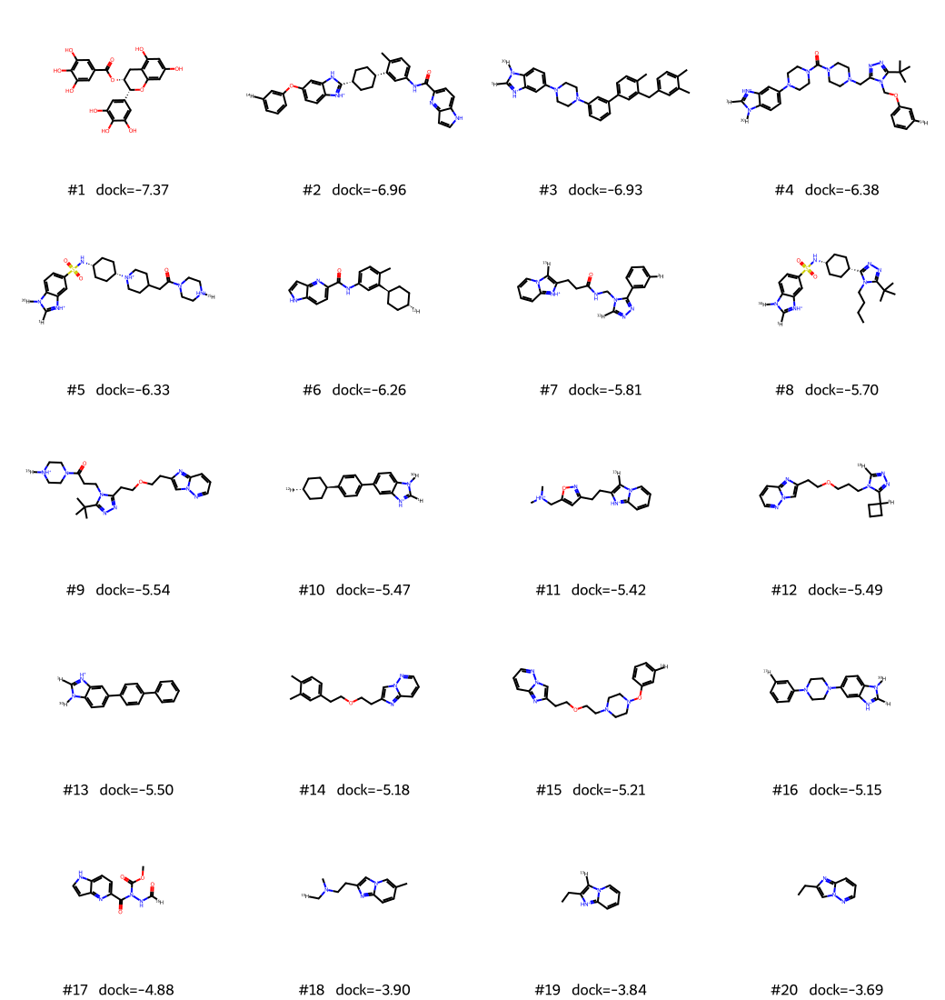

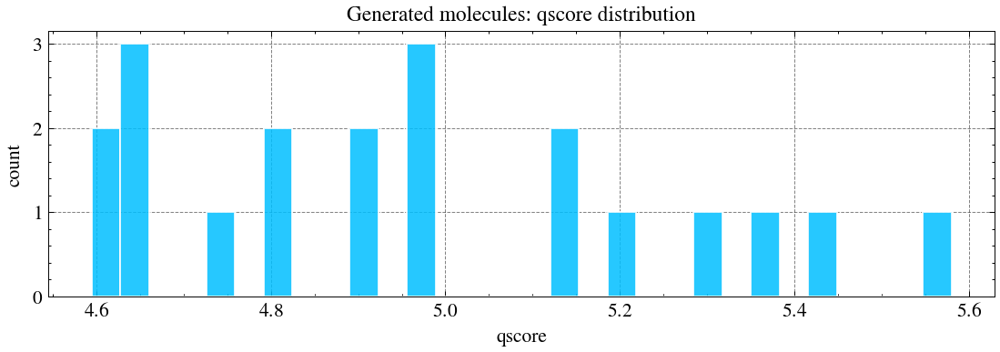

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/figures/generated_qscore_hist.png


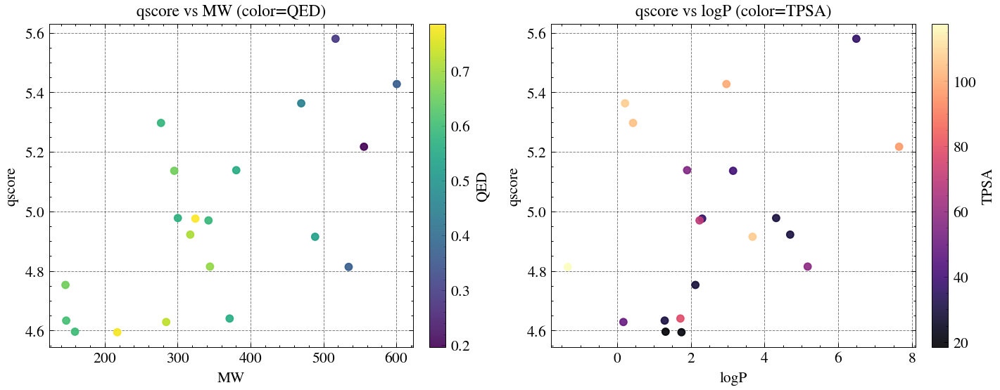

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/figures/generated_qscore_property_scatter.png


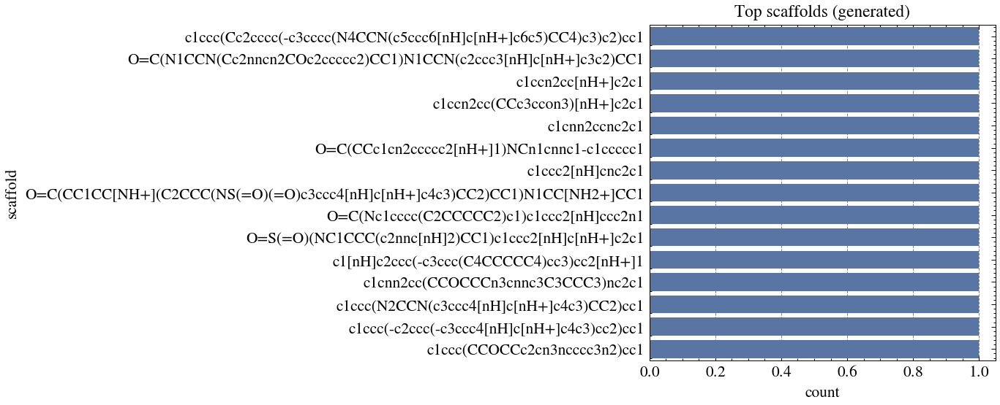

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/figures/generated_top_scaffolds.png


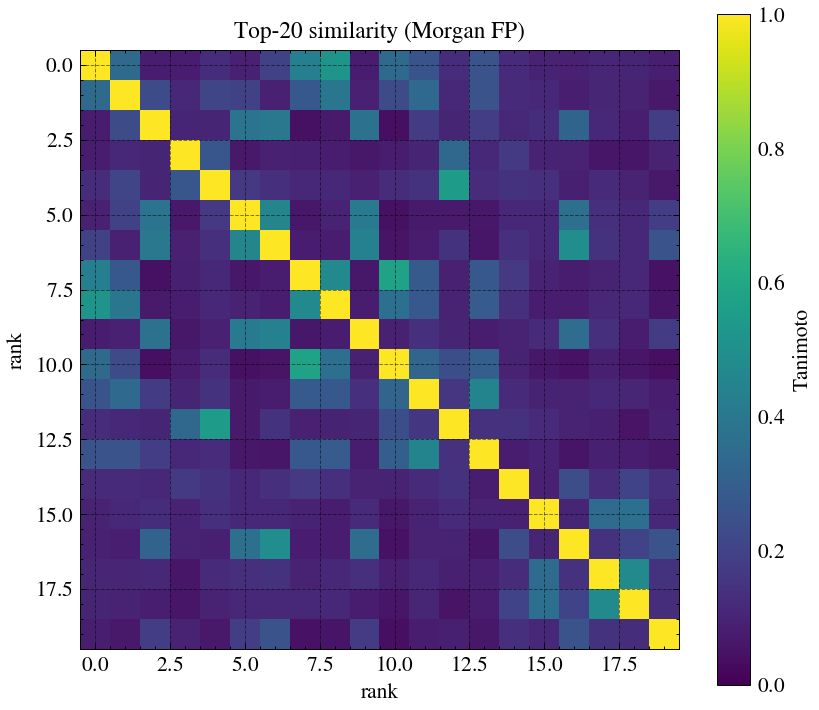

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/figures/generated_similarity_heatmap.png


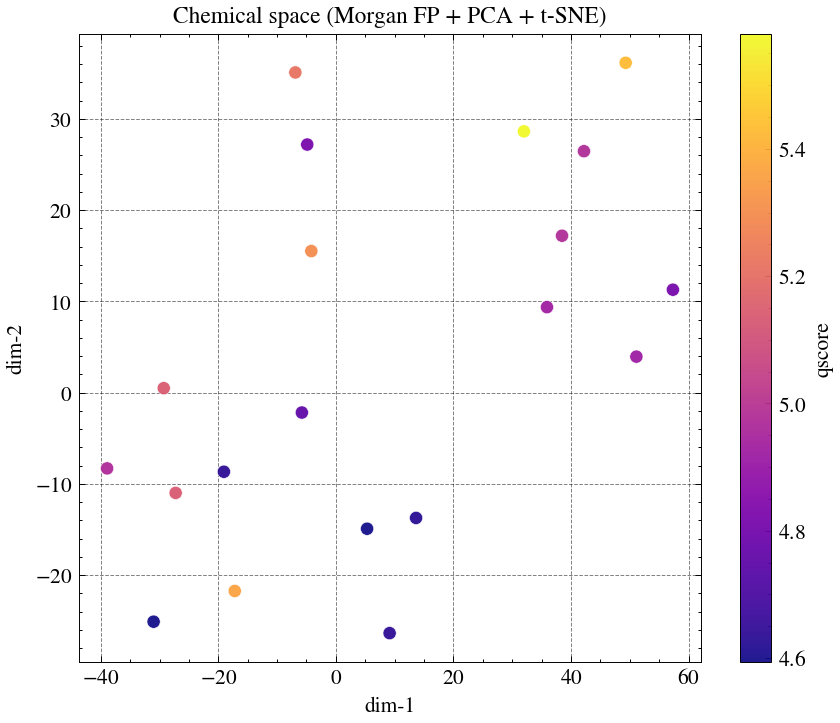

saved: /media/xuchengjie/E7562A2674DB25F7/Tongji/outputs/rhomol_run_20260126_205041/il6st_egcg_pocket_gnina/figures/generated_chemspace.png


In [14]:
# --- Figures for generated set + Top 20 panel ---
from rdkit.Chem import Crippen, Descriptors, QED
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import MolsToGridImage
from rdkit.Chem.Scaffolds import MurckoScaffold
from IPython.display import SVG, display

rdDepictor.SetPreferCoordGen(True)

# 2D panel for Top 20
show_mols = []
legends = []
for _, r in df_sorted.head(20).iterrows():
    smi = str(r["smiles"])
    m = Chem.MolFromSmiles(smi)
    if m is None:
        continue
    try:
        rdDepictor.Compute2DCoords(m, canonOrient=False)
    except TypeError:
        rdDepictor.Compute2DCoords(m)
    try:
        rdDepictor.NormalizeDepiction(m)
    except Exception:
        pass
    show_mols.append(m)
    legends.append(f"#{int(r['rank'])}  dock={float(r['dock_score']):.2f}")

svg_obj = MolsToGridImage(
    show_mols,
    molsPerRow=4,
    subImgSize=(260, 220),
    legends=legends,
    useSVG=True,
)

svg_text = svg_obj if isinstance(svg_obj, str) else getattr(svg_obj, "data", None)
if svg_text is None:
    svg_text = str(svg_obj)

svg_path = FIG_DIR_LOCAL / "top20.svg"
svg_path.write_text(svg_text, encoding="utf-8")
print("saved:", svg_path)
display(svg_obj if not isinstance(svg_obj, str) else SVG(svg_text))

# Generated-set analysis (qscore and basic properties)
if not mols_clean:
    print("No molecules.")
else:
    rows = []
    for i, m in enumerate(mols_clean):
        m2 = Chem.RemoveHs(m)
        q = float(m.GetProp("qscore")) if m.HasProp("qscore") else float("nan")
        rows.append(
            {
                "rank_qscore": int(i + 1),
                "qscore": float(q),
                "mw": float(Descriptors.MolWt(m2)),
                "logp": float(Crippen.MolLogP(m2)),
                "tpsa": float(Descriptors.TPSA(m2)),
                "hbd": float(Descriptors.NumHDonors(m2)),
                "hba": float(Descriptors.NumHAcceptors(m2)),
                "rings": float(Descriptors.RingCount(m2)),
                "qed": float(QED.qed(m2)),
                "smiles": Chem.MolToSmiles(m2, isomericSmiles=True),
            }
        )

    gen_df = pd.DataFrame(rows)

    plt.figure(figsize=(8.2, 3.0))
    plt.hist(gen_df["qscore"].dropna().values, bins=30, color="#00BFFF", alpha=0.85, edgecolor="white")
    plt.xlabel("qscore")
    plt.ylabel("count")
    plt.title("Generated molecules: qscore distribution")
    plt.tight_layout()
    out_path = FIG_DIR_LOCAL / "generated_qscore_hist.png"
    plt.savefig(out_path, bbox_inches="tight")
    plt.show()
    print("saved:", out_path)

    fig, axs = plt.subplots(1, 2, figsize=(10.4, 4.2))
    sc0 = axs[0].scatter(gen_df["mw"], gen_df["qscore"], c=gen_df["qed"], cmap="viridis", s=26, alpha=0.9)
    axs[0].set_xlabel("MW")
    axs[0].set_ylabel("qscore")
    axs[0].set_title("qscore vs MW (color=QED)")
    cb0 = fig.colorbar(sc0, ax=axs[0], fraction=0.046, pad=0.04)
    cb0.set_label("QED")

    sc1 = axs[1].scatter(gen_df["logp"], gen_df["qscore"], c=gen_df["tpsa"], cmap="magma", s=26, alpha=0.9)
    axs[1].set_xlabel("logP")
    axs[1].set_ylabel("qscore")
    axs[1].set_title("qscore vs logP (color=TPSA)")
    cb1 = fig.colorbar(sc1, ax=axs[1], fraction=0.046, pad=0.04)
    cb1.set_label("TPSA")

    fig.tight_layout()
    out_path = FIG_DIR_LOCAL / "generated_qscore_property_scatter.png"
    fig.savefig(out_path, bbox_inches="tight")
    plt.show()
    print("saved:", out_path)

    scaffolds = []
    for smi in gen_df["smiles"].tolist():
        m = Chem.MolFromSmiles(smi)
        sc = MurckoScaffold.MurckoScaffoldSmiles(mol=m, includeChirality=False) if m is not None else ""
        scaffolds.append(sc)
    gen_df["scaffold"] = scaffolds
    sc = gen_df["scaffold"].value_counts().head(15).reset_index()
    sc.columns = ["scaffold", "count"]

    plt.figure(figsize=(10.0, 4.2))
    try:
        import seaborn as sns

        sns.barplot(data=sc, x="count", y="scaffold", color="#4C72B0")
    except Exception:
        plt.barh(sc["scaffold"], sc["count"], color="#4C72B0")
        plt.gca().invert_yaxis()
    plt.title("Top scaffolds (generated)")
    plt.tight_layout()
    out_path = FIG_DIR_LOCAL / "generated_top_scaffolds.png"
    plt.savefig(out_path, bbox_inches="tight")
    plt.show()
    print("saved:", out_path)

    # Similarity heatmap (top-K by qscore)
    top_k = int(min(30, len(mols_clean)))
    fps = []
    for m in mols_sorted[:top_k]:
        m2 = Chem.RemoveHs(m)
        fp = rdMolDescriptors.GetMorganFingerprintAsBitVect(m2, radius=2, nBits=2048)
        fps.append(fp)

    sim = np.zeros((top_k, top_k), dtype=np.float32)
    for i in range(top_k):
        sims = DataStructs.BulkTanimotoSimilarity(fps[i], fps)
        sim[i, :] = np.asarray(sims, dtype=np.float32)

    plt.figure(figsize=(6.2, 5.4))
    plt.imshow(sim, vmin=0.0, vmax=1.0, cmap="viridis")
    plt.colorbar(label="Tanimoto")
    plt.title(f"Top-{top_k} similarity (Morgan FP)")
    plt.xlabel("rank")
    plt.ylabel("rank")
    plt.tight_layout()
    out_path = FIG_DIR_LOCAL / "generated_similarity_heatmap.png"
    plt.savefig(out_path, bbox_inches="tight")
    plt.show()
    print("saved:", out_path)

    # Chemical space embedding (PCA + t-SNE)
    from sklearn.decomposition import PCA
    from sklearn.manifold import TSNE

    X = np.zeros((top_k, 2048), dtype=np.float32)
    for i, fp in enumerate(fps):
        arr = np.zeros((2048,), dtype=np.int8)
        DataStructs.ConvertToNumpyArray(fp, arr)
        X[i] = arr.astype(np.float32)

    if top_k < 3:
        emb = PCA(n_components=min(2, top_k, X.shape[1]), random_state=42).fit_transform(X)
        if emb.shape[1] == 1:
            emb = np.hstack([emb, np.zeros((emb.shape[0], 1), dtype=np.float32)])
        title = "Chemical space (Morgan FP + PCA)"
    else:
        pca_dim = min(32, X.shape[1], max(2, top_k - 1))
        Xp = PCA(n_components=pca_dim, random_state=42).fit_transform(X)
        perplexity = min(30, max(5, top_k // 3))
        perplexity = min(perplexity, max(1, top_k - 1))
        emb = TSNE(n_components=2, perplexity=perplexity, random_state=42).fit_transform(Xp)
        title = "Chemical space (Morgan FP + PCA + t-SNE)"

    plt.figure(figsize=(6.4, 5.4))
    c = gen_df.iloc[:top_k]["qscore"].values
    scp = plt.scatter(emb[:, 0], emb[:, 1], c=c, cmap="plasma", s=46, alpha=0.92, edgecolor="white", linewidth=0.3)
    plt.colorbar(scp, label="qscore")
    plt.title(title)
    plt.xlabel("dim-1")
    plt.ylabel("dim-2")
    plt.tight_layout()
    out_path = FIG_DIR_LOCAL / "generated_chemspace.png"
    plt.savefig(out_path, bbox_inches="tight")
    plt.show()
    print("saved:", out_path)
